# 1.Importing Libraries for Animal Species Classification<a id='imports'></a>

In [20]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Import libraries
import os  # For interacting with the file system
import shutil  # For managing files and directories in a cross-platform manner
import keras  # For building deep learning models
import numpy as np  # For numerical operations on arrays
from glob import glob  # For finding file paths
from tqdm import tqdm  # For progress bars
import tensorflow as tf
# Data preprocessing
from keras.preprocessing.image import ImageDataGenerator  # For image data augmentation
import tensorflow as tf
# Data visualization
import seaborn as sns  # For statistical visualizations
import plotly.graph_objs as go  # For interactive visualizations
import matplotlib.pyplot as plt  # For creating static plots

# Model architecture
from keras import Sequential  # For building sequential models
from keras.models import load_model  # For loading pre-trained models
from keras.layers import Dense, GlobalAvgPool2D as GAP, Dropout  # For defining model layers

# Training callbacks
from keras.callbacks import ModelCheckpoint, EarlyStopping  # For training callbacks

# Pre-trained models
from tensorflow.keras.applications import InceptionV3, Xception, ResNet152V2  # For using pre-trained models


# 2. Exploring the Animal-10 Dataset: Obtaining Class Names and Counting Classes<a id='data-exploration'></a>


In [ ]:
# Set the path to the dataset
# data_path = '../input/animals10/raw-img'
data_path = '/content/drive/MyDrive/raw-img/'

# Get a list of class names from the data path
class_names = sorted(os.listdir(data_path))

# Count the number of classes
num_classes = len(class_names)

# Print the class names and the total number of classes
print("Class Names: \n", class_names)
print("Number of Classes:", num_classes)

Class Names: 
 ['cane', 'cavallo', 'elefante', 'farfalla', 'gallina', 'gatto', 'mucca', 'pecora', 'ragno', 'scoiattolo']
Number of Classes: 10


# 3. Examining Class Distribution in the Animal-10 Dataset<a id='data-examination'></a>


In [ ]:
# Get the number of samples in each class
class_sizes = []
for name in class_names:
    class_size = len(os.listdir(data_path + "/" + name))
    class_sizes.append(class_size)

# Print the class distribution
print("Class Distribution:\n", class_sizes)

Class Distribution:
 [4863, 2623, 1446, 2112, 3108, 1668, 1866, 1820, 4821, 1862]


In [ ]:
# to convert lists to dictionary **************
class_name_size = dict(zip(class_names, class_sizes))

In [ ]:
class_name_size

{'cane': 4863,
 'cavallo': 2623,
 'elefante': 1446,
 'farfalla': 2112,
 'gallina': 3108,
 'gatto': 1668,
 'mucca': 1866,
 'pecora': 1820,
 'ragno': 4821,
 'scoiattolo': 1862}

# 4. Visualizing Class Distribution in the Animal-10 Dataset using a Pie Chart and Bar Graph<a id='visualizing-class-distribution'></a>


In [ ]:
# Define the data
data = go.Pie(labels=class_names, values=class_sizes)

# Define the layout
layout = go.Layout(title={"text": "Class Distribution", "x": 0.5})

# Create the figure
fig = go.Figure(data=data, layout=layout)

# Display the figure
fig.show()

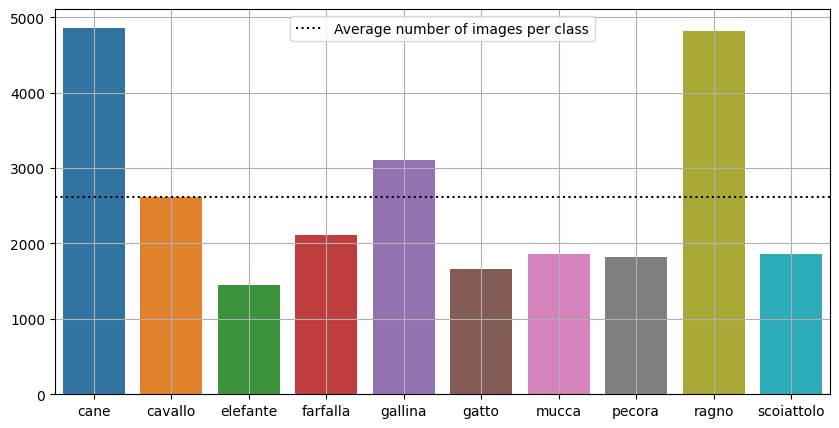

In [ ]:
# Plot a bar graph of the number of images in each class

# Set the size of the figure
plt.figure(figsize=(10,5))

# Plot a bar chart using the class names as the x-axis and class sizes as the y-axis
sns.barplot(x=class_names, y=class_sizes)

# Add a grid to the plot
plt.grid()

# Add a horizontal line to show the mean number of images across all classes
plt.axhline(np.mean(class_sizes), color='black', linestyle=':', label="Average number of images per class")

# Add a legend to the plot
plt.legend()

# Show the plot
plt.show()

In [ ]:
np.min(class_sizes)

1446

# 5. Sampling and Creating Sampled Data Directory<a id='data-sampling'></a>


In [ ]:
# Set the path to the directory where the sampled data will be saved
sampled_data_path = './sampled-data'

# Create the sampled data directory if it doesn't exist
if not os.path.exists(sampled_data_path):
    os.mkdir(sampled_data_path)

# Set the percentage of each class to sample
sample_percent = 0.1

# Define a dictionary that maps the original class names to their English names
class_names_dict = {
    'cane': 'dog',
    'cavallo': 'horse',
    'elefante': 'elephant',
    'farfalla': 'butterfly',
    'gallina': 'chicken',
    'gatto': 'cat',
    'mucca': 'cow',
    'pecora': 'sheep',
    'ragno': 'spider',
    'scoiattolo': 'squirrel'
}

# Loop through each class directory and copy 2000 images or less to the sampled data directory
for class_name in os.listdir(data_path):
    # Get the path to the original class directory
    class_path = os.path.join(data_path, class_name)
    # Get the English name of the class
    class_name_en = class_names_dict[class_name]
    # Get the path to the sampled class directory
    sampled_class_path = os.path.join(sampled_data_path, class_name_en)
    # Create the sampled class directory and fill it up only if it doesn't exist ********
    if not os.path.exists(sampled_class_path):
        os.mkdir(sampled_class_path)
        # Get a list of all the image files in the class directory
        image_files = os.listdir(class_path)
        # Calculate the number of images to sample **************
        image_class_size = class_name_size[class_name]
        if image_class_size > 2000:
            num_images = 2000
        else:
            num_images = int(image_class_size)
        # Sample the images
        sampled_images = np.random.choice(image_files, size=num_images, replace=False)
        # Copy the sampled images to the sampled class directory
        for image_name in sampled_images:
            src_path = os.path.join(class_path, image_name)
            dst_path = os.path.join(sampled_class_path, image_name)
            shutil.copyfile(src_path, dst_path)


In [21]:
# Get a list of class names from the sampled data directory
class_names = sorted(os.listdir(sampled_data_path))

# Get the number of samples in each class
class_sizes = []
for name in class_names:
    # Get the number of samples in the class directory
    class_size = len(os.listdir(os.path.join(sampled_data_path, name)))
    class_sizes.append(class_size)

# Print the class distribution
print("Class Distribution:\n", class_sizes)


Class Distribution:
 [2000, 1668, 2000, 1866, 0, 1446, 2000, 1820, 2000, 1862]


In [22]:
# Define the data
data = go.Pie(labels=class_names, values=class_sizes)

# Define the layout
layout = go.Layout(title={"text": "Class Distribution", "x": 0.5})

# Create the figure
fig = go.Figure(data=data, layout=layout)

# Display the figure
fig.show()

# 6. Data Preparation and Augmentation<a id='data-preparation'></a>


In [23]:
# Initialize Generator with the specified image transformations and preprocessing
# rescale: normalizes pixel values from 0-255 to 0-1
# horizontal_flip: randomly flips images horizontally
# vertical_flip: randomly flips images vertically
# rotation_range: randomly rotates images by a given range in degrees
# validation_split: splits the data into training and validation sets, with 20% of the data used for validation
data_generator = ImageDataGenerator(
    rescale=1./255,
    horizontal_flip=True,
    vertical_flip=True,
    rotation_range=20,
    validation_split=0.2)

# Load training data from the specified directory and apply the generator
# target_size: resizes the images to a specified size
# class_mode: specifies the type of label encoding, binary for 2 classes
# batch_size: specifies the number of samples per batch
# shuffle: shuffles the data after each epoch
# subset: specifies the subset of data to load, in this case, the training set
train_data = data_generator.flow_from_directory(
    sampled_data_path,
    target_size=(256,256),
    class_mode='binary',
    batch_size=32,
    shuffle=True,
    subset='training')

# Load validation data from the specified directory and apply the generator
# subset: specifies the subset of data to load, in this case, the validation set
valid_data = data_generator.flow_from_directory(
    sampled_data_path,
    target_size=(256,256),
    class_mode='binary',
    batch_size=32,
    shuffle=True,
    subset='validation')

Found 13331 images belonging to 10 classes.
Found 3331 images belonging to 10 classes.


# 7. Data Visualization<a id='data-visualization'></a>


In [24]:
def show_image(image, image_title=None):
    '''
    This function takes in an image and an optional title and plots the image.
    '''
    # Display the image
    plt.imshow(image)

    # Set the title of the plot if provided
    plt.title(image_title)

    # Turn off the axes in the plot
    plt.axis('off')

In [25]:
def get_random_data(data_tuple):
    """
    Function to get a random data point from a given dataset.

    Args:
    data_tuple (tuple): A tuple containing the dataset images and labels as numpy arrays.

    Returns:
    A random image and its corresponding label as numpy arrays.
    """
    images, labels = data_tuple
    # get a random index for an image in the dataset
    idx = np.random.randint(len(images))

    # select the image and its corresponding label using the random index
    image, label = images[idx], labels[idx]

    # return the selected image and label
    return image, label


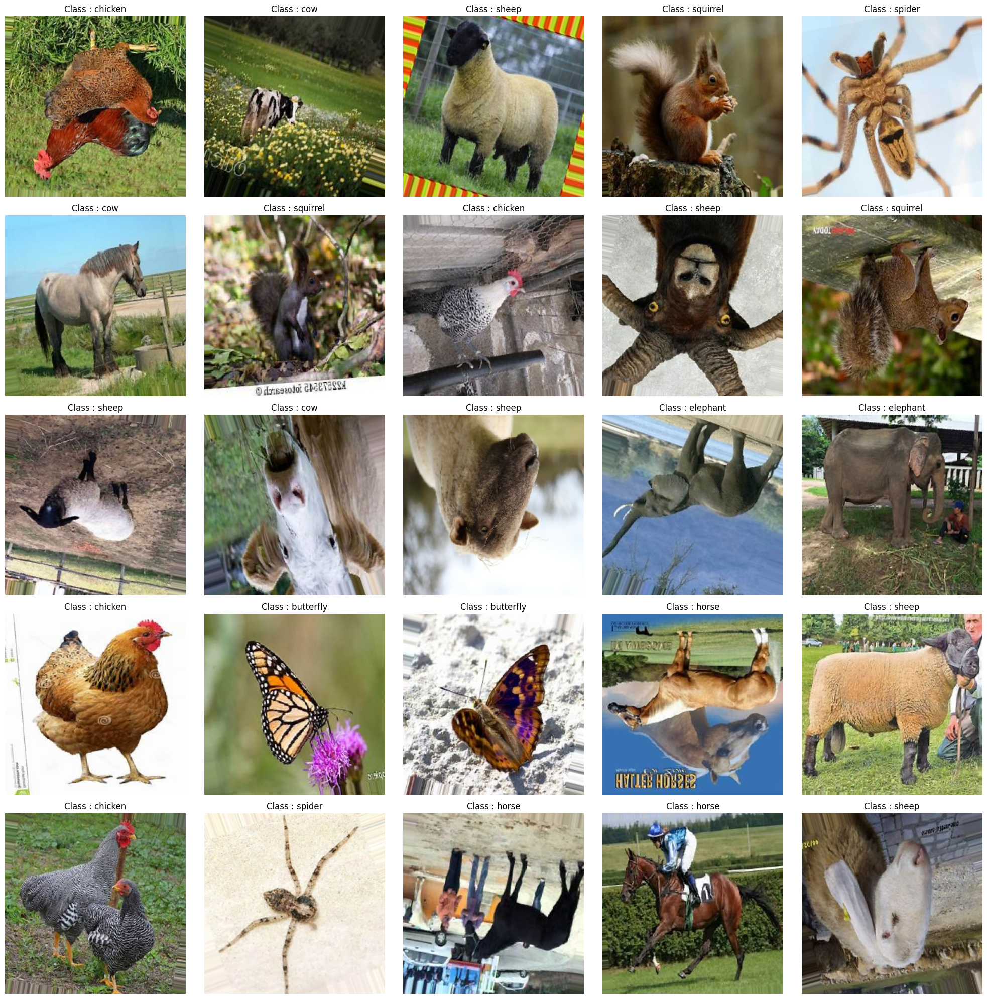

In [26]:
# Set the figure size for the plot
plt.figure(figsize=(20,20))

# Initialize a counter for the subplots
counter=1

# Loop over the train dataset
for images, labels in iter(train_data):

    # Get a random image and label
    image, label = get_random_data([images, labels])

    # Plot the image with its class name as the title
    plt.subplot(5,5,counter)
    show_image(image, image_title=f"Class : {class_names[int(label)]}")

    # Increment the counter
    counter+=1

    # End the loop when 25 images have been plotted
    if counter>=26: break

# Adjust the layout and display the plot
plt.tight_layout()
plt.show()


# 8. Model Training<a id='model training'></a>


In [ ]:
# Specify the name of the model as "ResNet152V2".
name = "ResNet152V2"

# Load the pre-trained ResNet152V2 model, freeze its weights and exclude its final classification layer.
base_model = ResNet152V2(include_top=False, input_shape=(256,256,3), weights='imagenet')
base_model.trainable = False

# Create a sequential model with the ResNet152V2 base model, a global average pooling layer, two fully connected layers, and a final softmax classification layer.
resnet152V2 = Sequential([
    base_model,
    GAP(),
    Dense(256, activation='relu'),
    Dropout(0.2),
    Dense(num_classes, activation='softmax')
], name=name)

# Compile the model with sparse categorical cross-entropy as the loss function, Adam optimizer and accuracy as the evaluation metric.
resnet152V2.compile(
    loss='sparse_categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

# Set up the EarlyStopping and ModelCheckpoint callbacks to monitor the training process and save the best model weights.
cbs = [
    EarlyStopping(patience=3, restore_best_weights=True),
    ModelCheckpoint(name + ".h5", save_best_only=True)
]

# Train the model using the training and validation datasets, using 50 epochs and the previously defined callbacks.
resnet152V2.fit(
    train_data, validation_data=valid_data,
    epochs=50, callbacks=cbs
)


234545216/234545216 [==============================] - 1s 0us/step
Epoch 1/50
467/467 [==============================] - ETA: 0s - loss: 0.4426 - accuracy: 0.8596

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.



467/467 [==============================] - 380s 781ms/step - loss: 0.4426 - accuracy: 0.8596 - val_loss: 0.3076 - val_accuracy: 0.8952
Epoch 2/50
467/467 [==============================] - 336s 720ms/step - loss: 0.3122 - accuracy: 0.8967 - val_loss: 0.2849 - val_accuracy: 0.9073
Epoch 3/50
467/467 [==============================] - 352s 754ms/step - loss: 0.2704 - accuracy: 0.9105 - val_loss: 0.2869 - val_accuracy: 0.9067
Epoch 4/50
467/467 [==============================] - 338s 723ms/step - loss: 0.2508 - accuracy: 0.9172 - val_loss: 0.2475 - val_accuracy: 0.9207
Epoch 5/50
467/467 [==============================] - 335s 718ms/step - loss: 0.2344 - accuracy: 0.9208 - val_loss: 0.2598 - val_accuracy: 0.9116
Epoch 6/50
467/467 [==============================] - 333s 713ms/step - loss: 0.2135 - accuracy: 0.9307 - val_loss: 0.2886 - val_accuracy: 0.9153
Epoch 7/50
467/467 [==============================] - 341s 730ms/step - loss: 0.2011 - accuracy: 0.9346 - val_loss: 0.2331 - val_accura

In [ ]:
# Specify the name of the model as "Inception".
name = "Inception"

# Load the pre-trained InceptionV3 model, freeze its weights and exclude its final classification layer.
base_model = InceptionV3(include_top=False, input_shape=(256,256,3), weights='imagenet')
base_model.trainable = False

# Create a sequential model with the InceptionV3 base model, a global average pooling layer, two fully connected layers, and a final softmax classification layer.
inception = Sequential([
    base_model,
    GAP(),
    Dense(256, activation='relu'),
    Dropout(0.2),
    Dense(num_classes, activation='softmax')
], name=name)

# Compile the model with sparse categorical cross-entropy as the loss function, Adam optimizer and accuracy as the evaluation metric.
inception.compile(
    loss='sparse_categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

# Set up the EarlyStopping and ModelCheckpoint callbacks to monitor the training process and save the best model weights.
cbs = [
    EarlyStopping(patience=3, restore_best_weights=True),
    ModelCheckpoint(name + ".h5", save_best_only=True)
]

# Train the model using the training and validation datasets, using 50 epochs and the previously defined callbacks.
inception.fit(
    train_data, validation_data=valid_data,
    epochs=50, callbacks=cbs
)


87910968/87910968 [==============================] - 0s 0us/step
Epoch 1/50
467/467 [==============================] - 335s 699ms/step - loss: 0.5287 - accuracy: 0.8327 - val_loss: 0.3647 - val_accuracy: 0.8861
Epoch 2/50
467/467 [==============================] - 292s 625ms/step - loss: 0.3844 - accuracy: 0.8764 - val_loss: 0.4746 - val_accuracy: 0.8577
Epoch 3/50
467/467 [==============================] - 296s 635ms/step - loss: 0.3648 - accuracy: 0.8819 - val_loss: 0.3952 - val_accuracy: 0.8665
Epoch 4/50
467/467 [==============================] - 292s 625ms/step - loss: 0.3267 - accuracy: 0.8948 - val_loss: 0.2925 - val_accuracy: 0.9035
Epoch 5/50
467/467 [==============================] - 300s 642ms/step - loss: 0.3180 - accuracy: 0.8950 - val_loss: 0.2833 - val_accuracy: 0.9049
Epoch 6/50
467/467 [==============================] - 295s 633ms/step - loss: 0.2989 - accuracy: 0.9031 - val_loss: 0.3216 - val_accuracy: 0.8949
Epoch 7/50
467/467 [==============================] - 298s 

In [ ]:
# Specify the name of the model as "Xception".
name = "Xception"

# Load the pre-trained Xception model, freeze its weights and exclude its final classification layer.
base_model = Xception(include_top=False, input_shape=(256,256,3), weights='imagenet')
base_model.trainable = False

# Create a sequential model with the Xception base model, a global average pooling layer, two fully connected layers, and a final softmax classification layer.
xception = Sequential([
    base_model,
    GAP(),
    Dense(256, activation='relu'),
    Dropout(0.2),
    Dense(num_classes, activation='softmax')
], name=name)

# Compile the model with sparse categorical cross-entropy as the loss function, Adam optimizer and accuracy as the evaluation metric.
xception.compile(
    loss='sparse_categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

# Set up the EarlyStopping and ModelCheckpoint callbacks to monitor the training process and save the best model weights.
cbs = [
    EarlyStopping(patience=3, restore_best_weights=True),
    ModelCheckpoint(name + ".h5", save_best_only=True)
]

# Train the model using the training and validation datasets, using 50 epochs and the previously defined callbacks.
xception.fit(
    train_data, validation_data=valid_data,
    epochs=50, callbacks=cbs
)


83683744/83683744 [==============================] - 1s 0us/step
Epoch 1/50
467/467 [==============================] - 339s 711ms/step - loss: 0.4654 - accuracy: 0.8511 - val_loss: 0.3205 - val_accuracy: 0.8925
Epoch 2/50
467/467 [==============================] - 310s 664ms/step - loss: 0.3417 - accuracy: 0.8890 - val_loss: 0.3046 - val_accuracy: 0.9030
Epoch 3/50
467/467 [==============================] - 306s 656ms/step - loss: 0.3056 - accuracy: 0.8981 - val_loss: 0.3470 - val_accuracy: 0.8882
Epoch 4/50
467/467 [==============================] - 308s 660ms/step - loss: 0.2872 - accuracy: 0.9028 - val_loss: 0.3044 - val_accuracy: 0.9027
Epoch 5/50
467/467 [==============================] - 310s 663ms/step - loss: 0.2692 - accuracy: 0.9118 - val_loss: 0.3129 - val_accuracy: 0.8965
Epoch 6/50
467/467 [==============================] - 306s 654ms/step - loss: 0.2574 - accuracy: 0.9133 - val_loss: 0.2840 - val_accuracy: 0.9083
Epoch 7/50
467/467 [==============================] - 309s 

# 9. Loading a Pre-trained ResNet152V2 Model and Printing its Summary.<a id='model-summary'></a>


In [27]:
# set the file path to the pre-trained model
model_file_path = './drive/MyDrive/ResNet152V2.h5'

# load the pre-trained model

loaded_model = tf.keras.models.load_model(model_file_path)

# print a summary of the model's architecture
loaded_model.summary()

Model: "ResNet152V2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet152v2 (Functional)    (None, 8, 8, 2048)        58331648  
                                                                 
 global_average_pooling2d (  (None, 2048)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense (Dense)               (None, 256)               524544    
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                                 
 dense_1 (Dense)             (None, 10)                2570      
                                                                 
Total params: 58858762 (224.53 MB)
Trainable params: 527114 (2.01 MB)
Non-trainable params: 58331648 (222.52 MB)
________

# 10. Evaluation of Pre-trained ResNet152V2 Model on Validation Dataset.<a id='model-evaluation'></a>


In [28]:
#This line of code evaluates the performance of the pre-trained model on the validation dataset.
loaded_model.evaluate(valid_data)

105/105 [==============================] - 69s 581ms/step - loss: 0.2481 - accuracy: 0.9234


[0.24812962114810944, 0.9234464168548584]

1/1 [==============================] - 0s 32ms/step


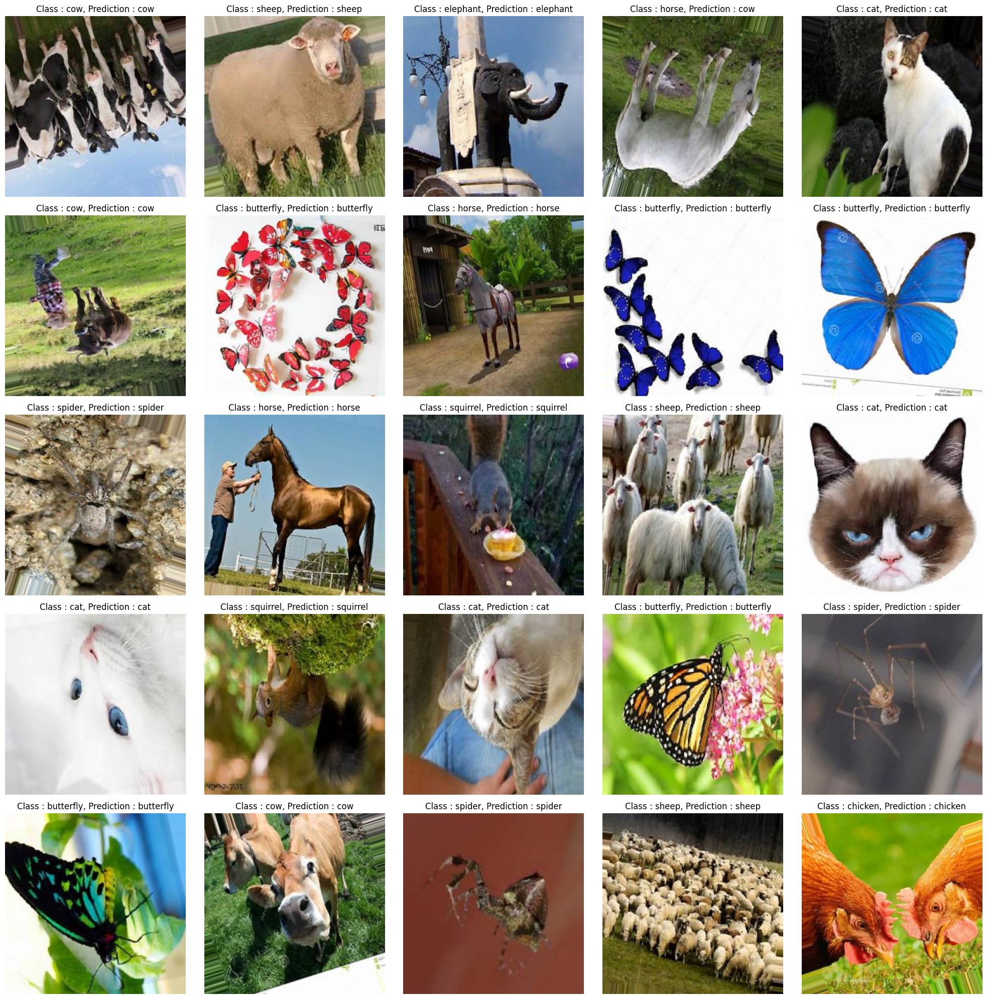

In [29]:
plt.figure(figsize=(20,20))
i=1
for images, labels in iter(valid_data):

    # Get Random Image and label
    image, label = get_random_data([images, labels])
    pred_label = class_names[np.argmax(loaded_model.predict(image[np.newaxis,...]))]

    # Plot it
    plt.subplot(5,5,i)
    show_image(image, image_title=f"Class : {class_names[int(label)]}, Prediction : {pred_label}")

    # Make sure to end the Loop
    i+=1
    if i>=26: break


plt.tight_layout()
plt.show()